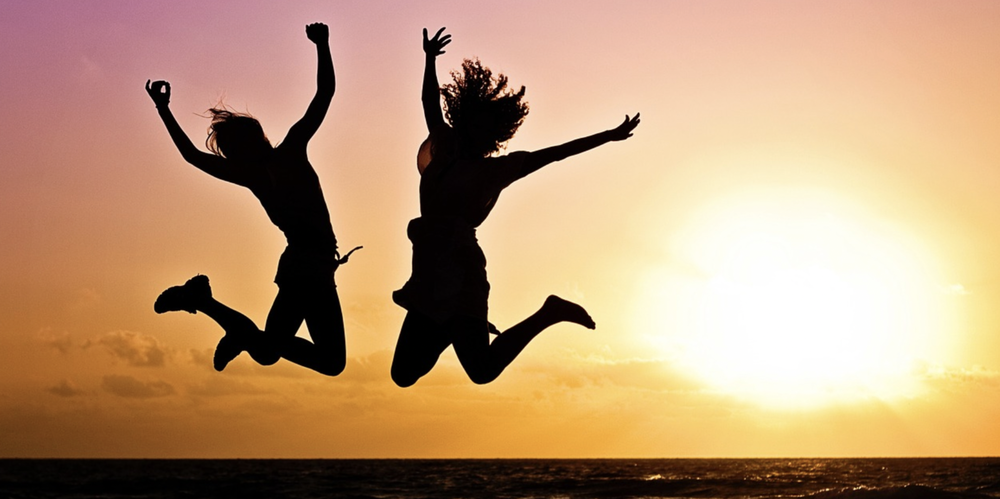

# Exploration 9. Human Segmentation
---
# (프로젝트) 인물사진 만들기

## [루브릭]
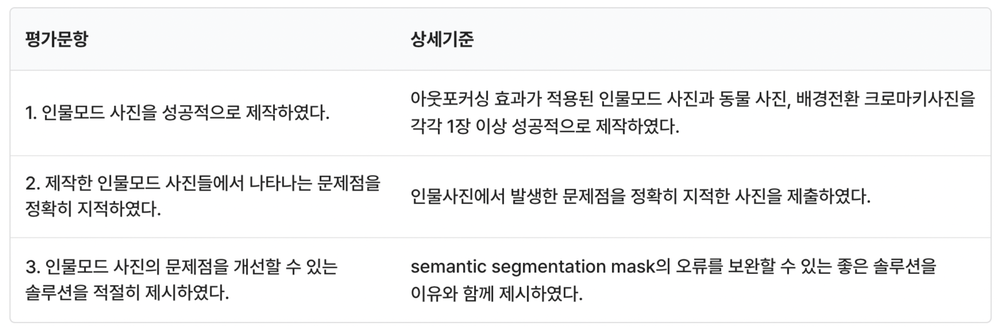

In [2]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt

segmentation을 수행할 이미지를 불러오도록 하겠습니다.

(1081, 1440, 3)


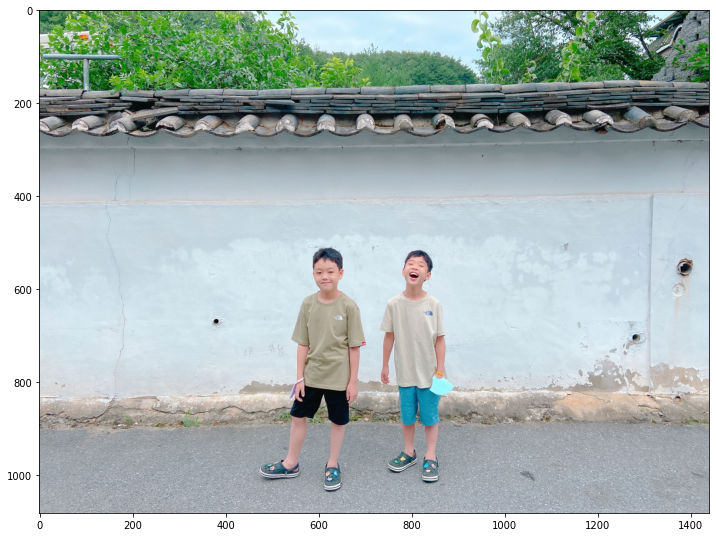

In [3]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/twins_3.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

semantic_segmentation인 pascal voc 모델을 활용하여 segmentation 작업을 수행해 보도록 하겠습니다. 본 모델은 이미지를 자동으로 segmentation을 시켜주는 모델이나 추후 segmentation 작업을 직접 수행하고 해당 완성도를 높일 수 있는 작업도 수행해 보면 좋을 것 같습니다.

In [4]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# # 모델 다운로드시 링크 참고
# model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# # 다운로드를 시작합니다
# urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

In [5]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

In [6]:
segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

본 모델은 background를 포함하여 총 21개 대상으로 물체를 분류합니다.

In [7]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

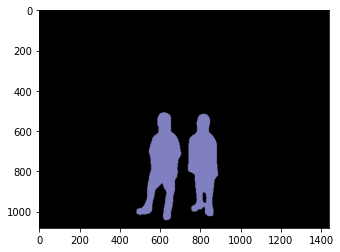

In [8]:
plt.imshow(output)
plt.show()

In [9]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [10]:
#segvalues에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [11]:
#컬러맵 만들기 (지정 컬러맵에 대한 추가 확인 필요)
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [12]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)

array([192, 128, 128])

In [13]:
seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

(1081, 1440)


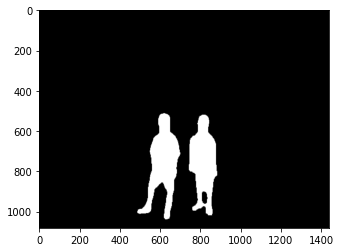

In [14]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

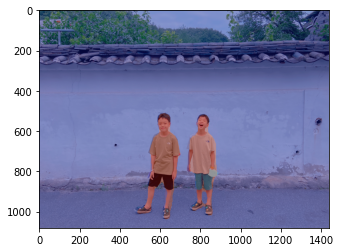

In [15]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

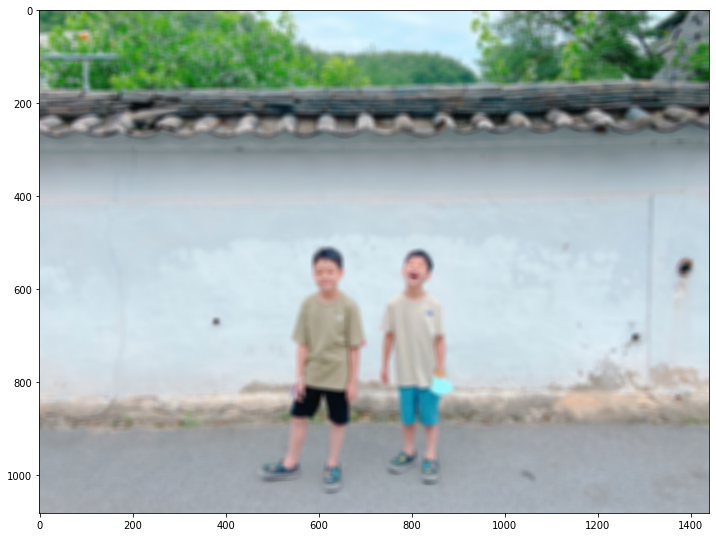

In [16]:
img_orig_blur = cv2.blur(img_orig, (13,13))
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

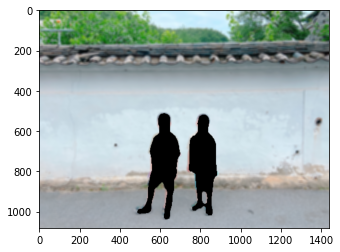

In [17]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()


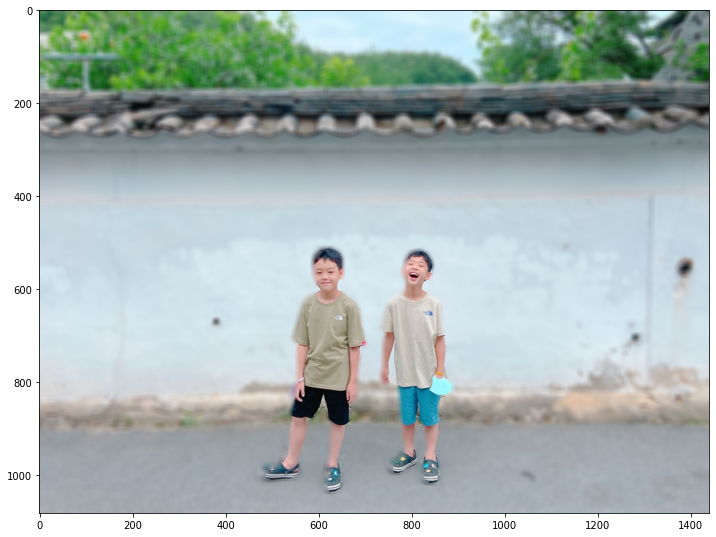

In [18]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

blur 값을 크게(13) 지정하다 보니 배경과 인물간의 조화가 매우 어색하고 아래 주황색 화살표 표시된 부분은 segmentation이 정확히 되지 않는 것을 확인할 수 있었습니다. 

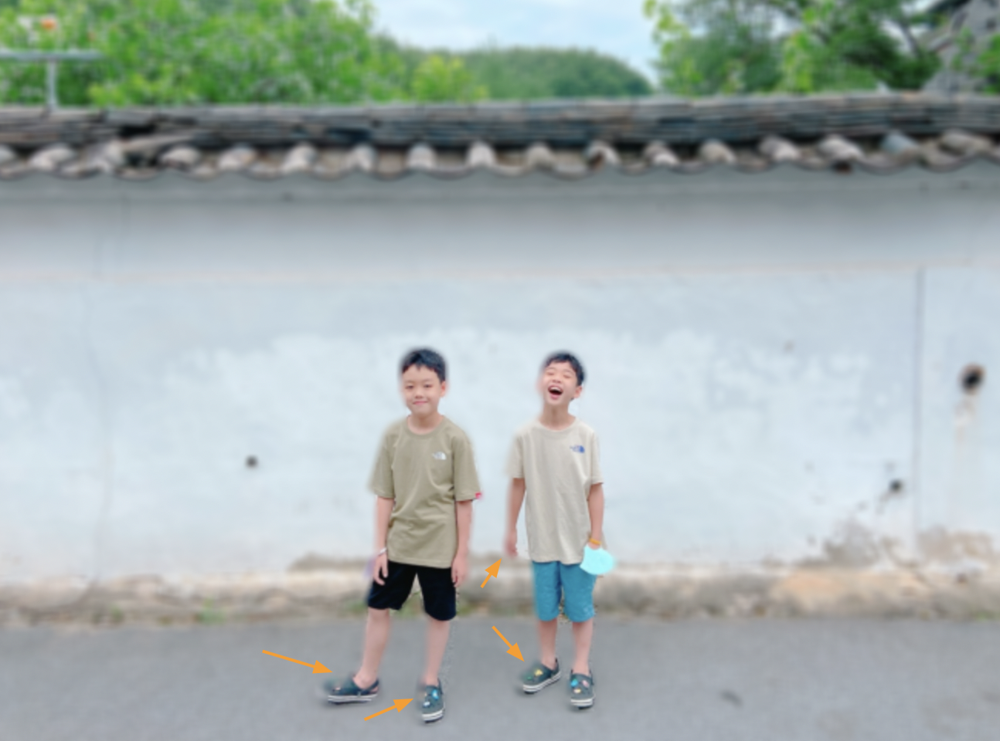

먼저 적합한 blur를 통해 좀 더 자연스러운 이미지 생성을 시도해 보도록 하겠습니다. 

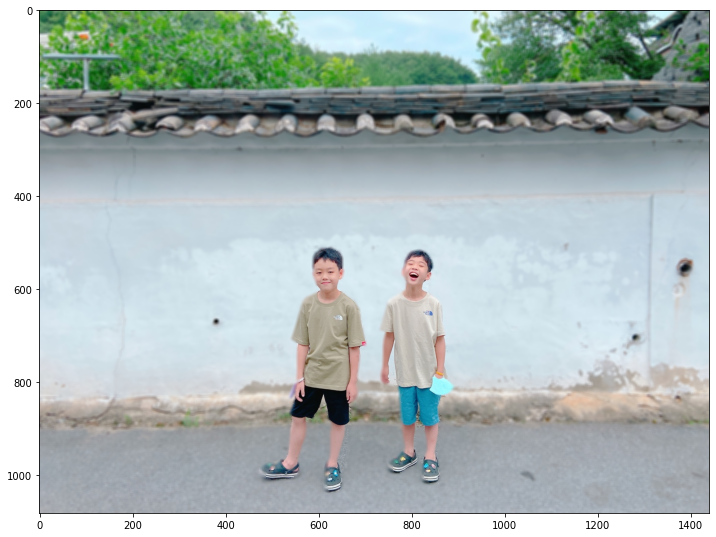

In [19]:
# blur 값을 7으로 낮춰어서 진행
img_orig_blur_7 = cv2.blur(img_orig, (7,7))

img_concat_7 = np.where(img_mask_color==255, img_orig, img_orig_blur_7)
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_concat_7, cv2.COLOR_BGR2RGB))
plt.show()

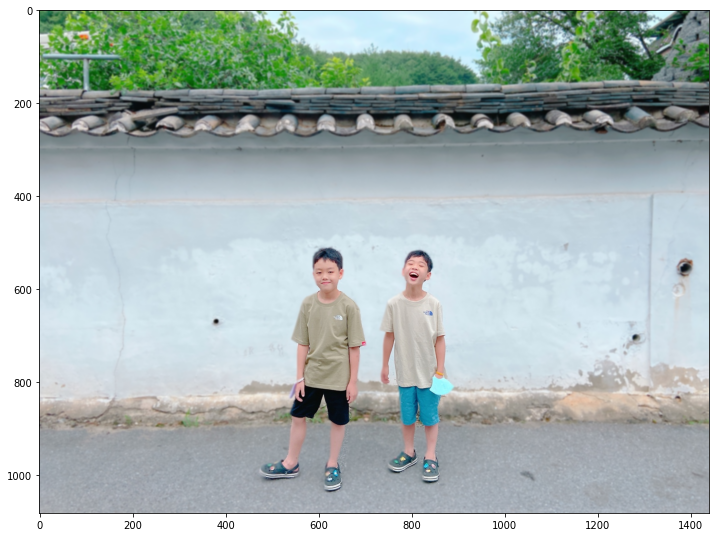

In [32]:
# GaussianBlur 사용
img_orig_gb = cv2.GaussianBlur(img_orig, (7,7), 0)

img_concat_gb = np.where(img_mask_color==255, img_orig, img_orig_gb)
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_concat_gb, cv2.COLOR_BGR2RGB))
plt.show()

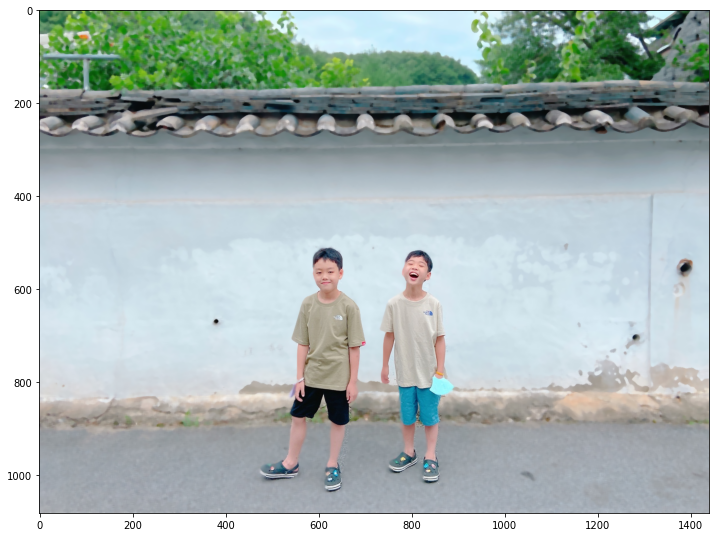

In [25]:
# medianBlur 사용
img_orig_mb = cv2.medianBlur(img_orig, 7)

img_concat_mb = np.where(img_mask_color==255, img_orig, img_orig_mb)
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_concat_mb, cv2.COLOR_BGR2RGB))
plt.show()

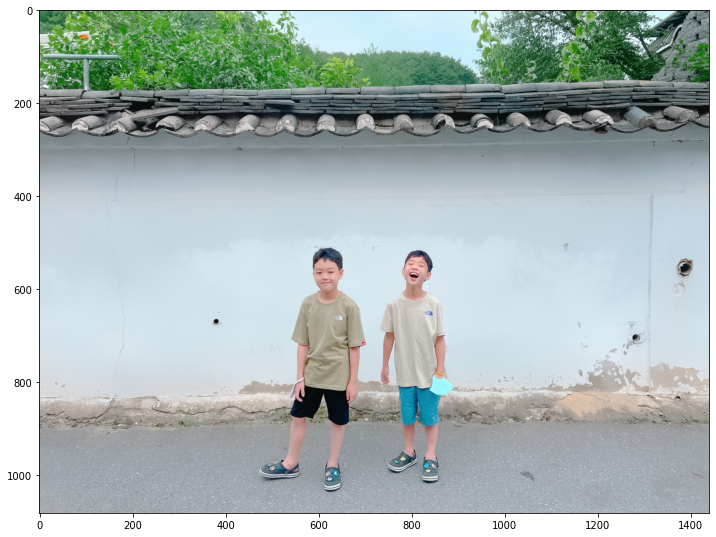

In [33]:
# bilateralFilter 사용
img_orig_bf = cv2.bilateralFilter(img_orig,-1, 30, 30)

img_concat_bf = np.where(img_mask_color==255, img_orig, img_orig_bf)
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_concat_bf, cv2.COLOR_BGR2RGB))
plt.show()

Bilateral Filter의 경우에는 오히려 배경이 선명해졌으며, Gaussian Filter의 경우 배경과 인물간 적정 수준으로 블랜딩이 잘 된 것으로 보입니다.

이번에는 동물이미지를 불러와 segmentation 수행 후 배경이미지를 변경해 보는 작업을 해보도록 하겠습니다.  

(2736, 3648, 3)


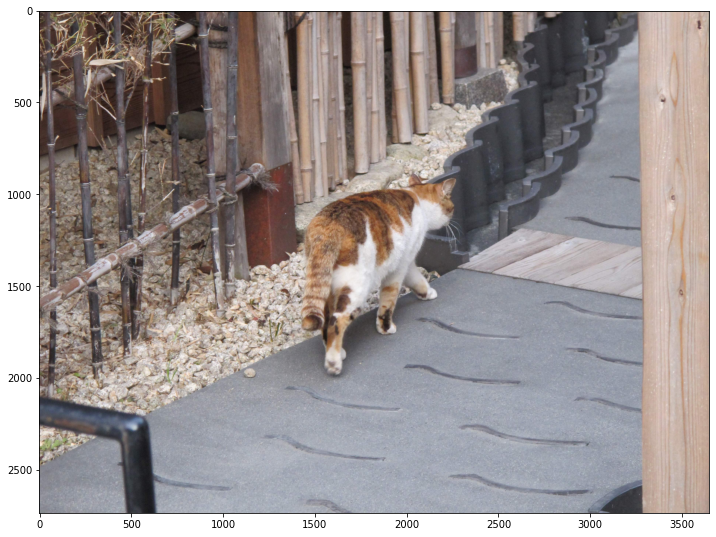

In [36]:
img_path_cat = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat.JPG'  
img_orig_cat = cv2.imread(img_path_cat) 

print(img_orig_cat.shape)

plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_orig_cat, cv2.COLOR_BGR2RGB))
plt.show()

In [37]:
segvalues, output = model.segmentAsPascalvoc(img_path_cat) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

In [38]:
segvalues # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([0, 8]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [39]:
colormap[8]

array([64,  0,  0])

(2736, 3648)


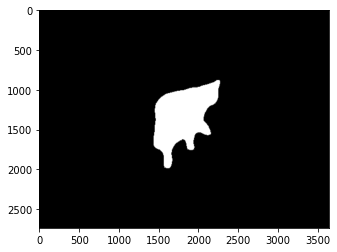

In [40]:
seg_color = (0, 0, 64)
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

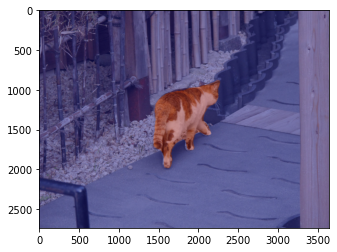

In [41]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show_cat = img_orig_cat.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show_cat = cv2.addWeighted(img_show_cat, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show_cat, cv2.COLOR_BGR2RGB))
plt.show()

배경으로 쓸 이미지를 가져와 보도록 하겠습니다. 

(1281, 1920, 3)


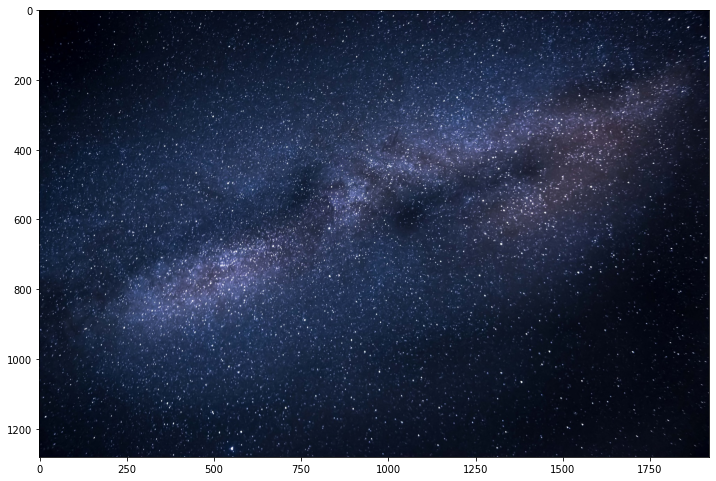

In [42]:
img_path_bg = os.getenv('HOME')+'/aiffel/human_segmentation/images/milkyway.jpg'  
img_orig_bg = cv2.imread(img_path_bg) 

print(img_orig_bg.shape)

plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_orig_bg, cv2.COLOR_BGR2RGB))
plt.show()

고양이 이미지의 크기가 더 크기 때문에 고양이 이미지를 배경 이미지에 맞춰 줄이도록 하겠습니다.

In [55]:
img_orig_2 = cv2.resize(img_orig_cat, dsize=(1920, 1281), fx=0, fy=0, interpolation=cv2.INTER_LINEAR)

In [56]:
img_mask_color_2 = cv2.resize(img_mask_color, dsize=(1920, 1281), fx=0, fy=0, interpolation=cv2.INTER_LINEAR)

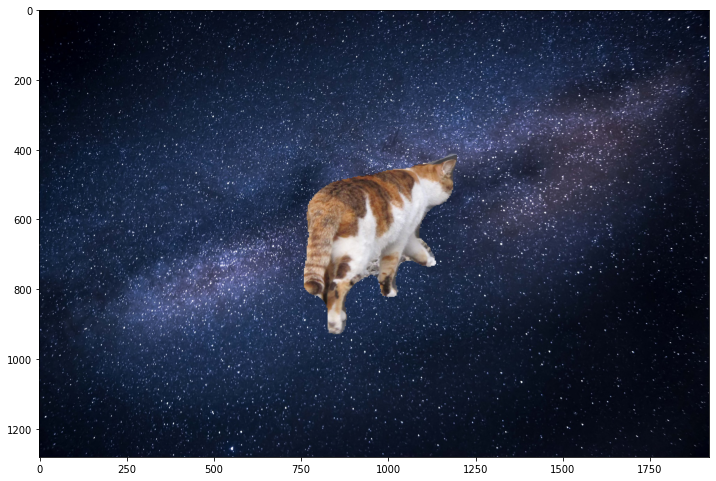

In [57]:
img_concat_bg = np.where(img_mask_color_2==255, img_orig_2, img_orig_bg)
plt.figure(figsize=(12,12))
plt.imshow(cv2.cvtColor(img_concat_bg, cv2.COLOR_BGR2RGB))
plt.show()

합성이 잘 되어서 은하수 위를 걷고 있는 고양이가 잘 표현되었습니다.

### [회고]  
- 단순히 기존 모델을 적용하여 segmentation을 수행하고 배경 이미지를 변경하는 것은 기존 노드의 정보를 따라가면 손쉽게 수행할 수 있었습니다. 그러나 segmentation을 한 모델을 그대로 적용하기에는 경계 부분 인식이 명확히 되지 않는 부분이 많아 아쉬움이 많이 남았습니다. detail하게 오류 부분을 수정하고 segmentation 정확도를 높일 수 있는 방법에 대해 지속적인 학습이 필요할 것으로 판단되었습니다.  


[참고]  
- cv2 blur 종류 : https://jvvp.tistory.com/1032